In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


In [2]:
path = "./input/"

# pandas DataFrame
df = pd.read_csv(path + "train.csv")
df_test = pd.read_csv(path + "test.csv")

data = pd.concat([df, df_test], sort=False)

print(df.shape)
print(df_test.shape)

(7134, 29)
(1794, 28)


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7134 entries, 0 to 7133
Data columns (total 29 columns):
Id                 7134 non-null object
groupId            7134 non-null object
matchId            7134 non-null object
assists            7134 non-null int64
boosts             7134 non-null int64
damageDealt        7134 non-null float64
DBNOs              7134 non-null int64
headshotKills      7134 non-null int64
heals              7134 non-null int64
killPlace          7134 non-null int64
killPoints         7134 non-null int64
kills              7134 non-null int64
killStreaks        7134 non-null int64
longestKill        7134 non-null float64
matchDuration      7134 non-null int64
matchType          7134 non-null object
maxPlace           7134 non-null int64
numGroups          7134 non-null int64
rankPoints         7134 non-null int64
revives            7134 non-null int64
rideDistance       7134 non-null float64
roadKills          7134 non-null int64
swimDistance       7134 n

In [4]:
# Create base line model
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error as MAE

str_list =["Id", "groupId", "matchId", "matchType"]
categorical_mask = (df.dtypes == object)
categorical_columns = df.columns[categorical_mask].tolist()
non_categorical_columns = df.columns[~categorical_mask].tolist()

print("categorical columns: ",categorical_columns)
print("non-categorical columns: ", non_categorical_columns)

X, y = df.drop(str_list, axis=1).iloc[:, :-1], df.iloc[:, -1]
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.3, random_state=42)

categorical columns:  ['Id', 'groupId', 'matchId', 'matchType']
non-categorical columns:  ['assists', 'boosts', 'damageDealt', 'DBNOs', 'headshotKills', 'heals', 'killPlace', 'killPoints', 'kills', 'killStreaks', 'longestKill', 'matchDuration', 'maxPlace', 'numGroups', 'rankPoints', 'revives', 'rideDistance', 'roadKills', 'swimDistance', 'teamKills', 'vehicleDestroys', 'walkDistance', 'weaponsAcquired', 'winPoints', 'winPlacePerc']


In [5]:
# XGBoost baseline
import xgboost as xgb

xgr = xgb.XGBRegressor()
xgr.fit(X_train, y_train)
preds_xgr = xgr.predict(X_valid)

score_xgb = MAE(y_valid, preds_xgr)
print("Score with xgboost regressor:", score_xgb)

[14:50:58] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Score with xgboost regressor: 0.0679120909551406


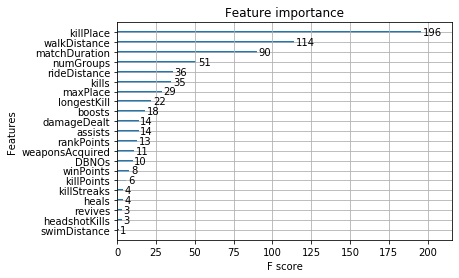

In [11]:
xgb.plot_importance(xgr)
plt.show()

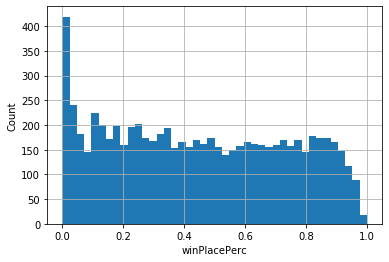

In [6]:
df["winPlacePerc"].hist(bins=int(0.5*np.sqrt(len(df["winPlacePerc"]))))
plt.xlabel("winPlacePerc")
plt.ylabel("Count")
plt.show()

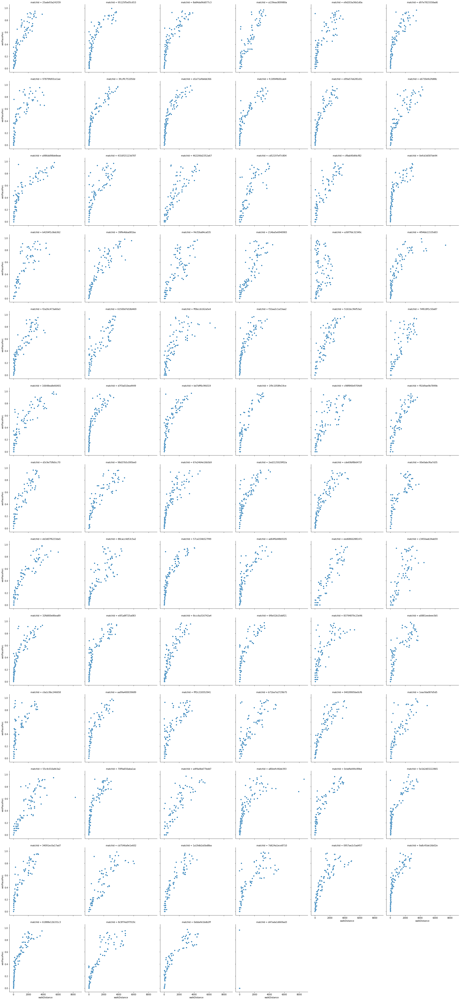

In [14]:
sns.relplot(x="walkDistance", 
            y="winPlacePerc", 
            data=df, 
            kind="scatter", 
            col="matchId",
            col_wrap=6)

In [29]:
sns.relplot(x="walkDistance", 
            y="winPlacePerc", 
            data=df, 
            kind="scatter", 
            col="Id",
            col_wrap=6)

ValueError: Image size of 2160x428040 pixels is too large. It must be less than 2^16 in each direction.

In [ ]:
sns.relplot(x="walkDistance", 
            y="winPlacePerc", 
            data=df, 
            kind="scatter", 
            col="groupId",
            col_wrap=6)

<Figure size 360x360 with 0 Axes>

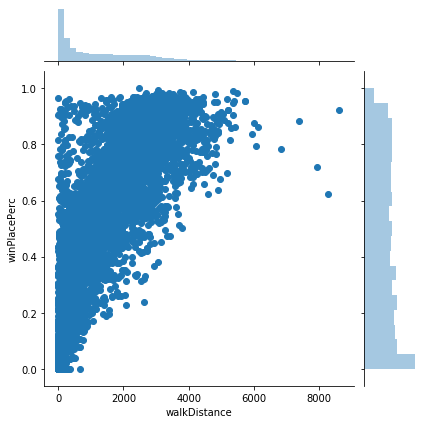

In [16]:
plt.figure(figsize=(5,5))
sns.jointplot("walkDistance", "winPlacePerc", data=df)
plt.show()

<Figure size 360x360 with 0 Axes>

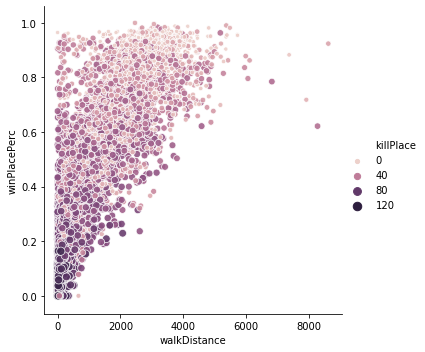

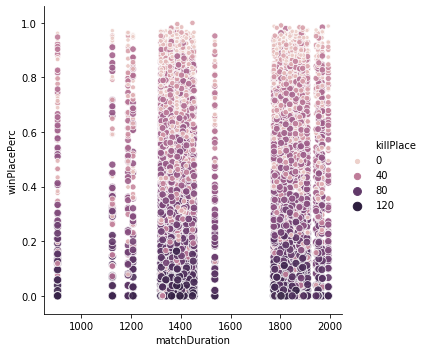

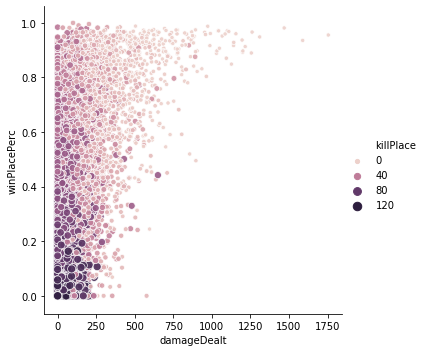

In [21]:
plt.figure(figsize=(5,5))

# plt.subplot(1,2,1)
sns.relplot(x="walkDistance",
            y="winPlacePerc",
            data=df,
            kind="scatter",
            size="killPlace",
            hue="killPlace",
            alpha=0.9)

# plt.subplot(1,2,2)
sns.relplot(x="matchDuration",
            y="winPlacePerc",
            data=df,
            kind="scatter",
            size="killPlace",
            hue="killPlace",
            alpha=0.9)

sns.relplot(x="damageDealt",
            y="winPlacePerc",
            data=df,
            kind="scatter",
            size="killPlace",
            hue="killPlace",
            alpha=0.9)

plt.show()

In [38]:
df["Binary_walkDistance"] = 0
df_test["Binary_walkDistance"] = 0

df.loc[df["walkDistance"]>0, "Binary_walkDistance"] = 1
df_test.loc[df_test["walkDistance"]>0, "Binary_walkDistance"] = 1

df.head()

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,...,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,Binary_walkDistance
0,2860d3f9ee4d4b,46f1b1c3bf0dae,25ade93a241f39,0,0,0.0,0,0,0,80,...,0.0,0,0.0,0,0,257.0,4,0,0.167487,1
1,0b88c47e54cdcc,5e92598b08bcb1,95125f5e05c653,0,2,359.0,4,0,0,5,...,262.7,0,0.0,0,0,1025.0,5,1607,0.610492,1
2,8f086d61515bc4,ed4cfbc560f490,8a84da96d077c3,0,0,223.5,1,0,0,15,...,0.0,0,0.0,0,0,712.8,2,1736,0.666206,1
3,7c037ca62a38a4,d2ff4830704e19,a139eac809980a,0,0,128.1,0,0,0,50,...,0.0,0,0.0,0,0,2738.0,4,1476,0.722956,1
4,82f08cde238c60,7c5002766d8c7a,e9d203a36b1d0a,0,0,200.0,2,0,0,36,...,0.0,0,0.0,0,0,129.4,2,0,0.204095,1


In [39]:
df_test.head()

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,...,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,Binary_walkDistance
0,c9ce5e5749758a,d1d34623858d02,6533442a513d6f,0,0,100.0,1,1,0,38,...,0,0.0,0,0.0,0,0,168.4,1,0,1
1,262418e6a1fd89,f0290ae9582198,976f4ae3c91669,0,0,0.0,0,0,0,76,...,0,0.0,0,0.0,0,0,280.7,3,1639,1
2,1fdaad049557d9,d1d34623858d02,6533442a513d6f,1,0,57.0,1,0,0,71,...,0,0.0,0,0.0,0,0,202.7,4,0,1
3,cb1761d22b957e,77234d376925f9,efd749a746587e,0,0,0.0,0,0,1,72,...,0,0.0,0,0.0,0,0,123.1,2,1465,1
4,1b86424e60c2e8,19a7b7ce87c841,098d3f2da942e7,0,1,348.1,1,0,2,16,...,0,0.0,0,0.0,0,0,1372.0,5,1398,1


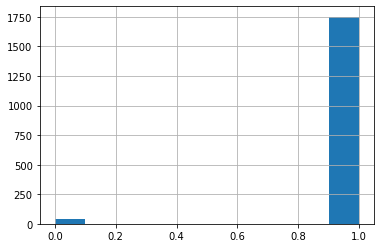

In [28]:
df_test["Binary_walkDistance"].hist()

In [51]:
# Train test split again for new df, df_test..
X, y = df.drop(str_list, axis=1).iloc[:, :-2], df.iloc[:, -2]
X.loc[X["walkDistance"]>0, "Binary_walkDistance"] = 1
# df.loc[df["walkDistance"]>0, "Binary_walkDistance"] = 1
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.3, random_state=42)
X.head()

,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,...,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,Binary_walkDistance
0,0,0,0.0,0,0,0,80,0,0,0,...,0,0.0,0,0.0,0,0,257.0,4,0,1.0
1,0,2,359.0,4,0,0,5,1387,4,2,...,1,262.7,0,0.0,0,0,1025.0,5,1607,1.0
2,0,0,223.5,1,0,0,15,1673,2,1,...,0,0.0,0,0.0,0,0,712.8,2,1736,1.0
3,0,0,128.1,0,0,0,50,1479,0,0,...,0,0.0,0,0.0,0,0,2738.0,4,1476,1.0
4,0,0,200.0,2,0,0,36,0,1,1,...,0,0.0,0,0.0,0,0,129.4,2,0,1.0


In [50]:
y.head()

0    0.167487
1    0.610492
2    0.666206
3    0.722956
4    0.204095
Name: winPlacePerc, dtype: float64

In [52]:
X_test = df_test.drop(str_list, axis=1)
X_test.head()

,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,...,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,Binary_walkDistance
0,0,0,100.0,1,1,0,38,0,1,1,...,0,0.0,0,0.0,0,0,168.4,1,0,1
1,0,0,0.0,0,0,0,76,1278,0,0,...,0,0.0,0,0.0,0,0,280.7,3,1639,1
2,1,0,57.0,1,0,0,71,0,0,0,...,0,0.0,0,0.0,0,0,202.7,4,0,1
3,0,0,0.0,0,0,1,72,1191,0,0,...,0,0.0,0,0.0,0,0,123.1,2,1465,1
4,0,1,348.1,1,0,2,16,1210,2,2,...,0,0.0,0,0.0,0,0,1372.0,5,1398,1


In [53]:
from sklearn.model_selection import GridSearchCV
import time

gbm_param_grid = {
                  "colsample_bytree":[0.3, 0.7, 1],
                  "n_estimators":[80],
                  "max_depth":[2, 3, 4, 5, 6, 7, 8],
                  "eta": [0.01],
                  "ealy_stopping_rounds":[8]
                  }

gbm = xgb.XGBRegressor()

grid_mae = GridSearchCV(estimator=gbm, param_grid=gbm_param_grid, scoring="neg_mean_absolute_error", cv=4, verbose=1)

start_time = time.time()

grid_mae.fit(X, y)

elapsed_time = time.time() - start_time

Fitting 4 folds for each of 21 candidates, totalling 84 fits
[15:37:51] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[15:37:52] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[15:37:53] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[15:37:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[15:37:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[15:37:56] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[15:37:57] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[15:37:58] WARNING: src/objective/regression_o

In [54]:
print("Time: ", elapsed_time)
print("Best parameters found: ",grid_mae.best_params_)
print("Lowest MAE found: ", np.abs(grid_mae.best_score_))

Time:  161.57561230659485
Best parameters found:  {'colsample_bytree': 1, 'ealy_stopping_rounds': 8, 'eta': 0.01, 'max_depth': 8, 'n_estimators': 80}
Lowest MAE found:  0.05178345828459917


In [55]:

# Submission data(X_test)
y_pred = grid_mae.predict(X_test)

# Validation data(X_valid)
y_valid_pred = grid_mae.predict(X_valid)
# xgb.plot_importance(grid_mae)
# plt.show()

print("Valid set MAE:", MAE(y_valid_pred, y_valid))


Valid set MAE: 0.025259627983181834


In [56]:
submission = pd.read_csv("submission.csv")
submission.head()

,winPlacePerc
0,0.160362
1,0.242487
2,0.215081
3,0.260389
4,0.552571


In [59]:
submission["winPlacePerc"] = y_pred
submission.to_csv("submission_grid_mae_3rd.csv", index=False)

submission_grid_mae_3rd = pd.read_csv("submission_grid_mae_3rd.csv")
submission_grid_mae_3rd.head()

,winPlacePerc
0,0.135399
1,0.279964
2,0.275894
3,0.308622
4,0.513954


<Figure size 720x288 with 0 Axes>

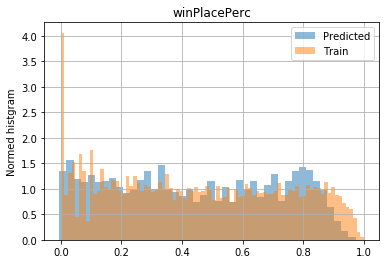

In [60]:
plt.figure(figsize=(10,4))

submission_grid_mae_3rd.hist(bins=int(np.sqrt(submission_grid_mae_3rd.shape[0])), normed=True, alpha=0.5, label="Predicted")
y.hist(bins=int(np.sqrt(y.shape[0])), normed=True, alpha=0.5, label="Train")
plt.ylabel("Normed histgram")
plt.legend()
plt.show()
plt.show()

In [9]:
sns.relplot(x="walkDistance", y="winPlacePerc", data=df, kind="scatter", row="groupId")

ValueError: Image size of 360x1166040 pixels is too large. It must be less than 2^16 in each direction.